## Diffusion Model

In this notebook the idea is to implement a simple diffusion model
to generate the images of protoplanetary disk 
THis is the first notebook where we have not implemented any modifications to 
the vanilla diffusion model.

The code is learnt from the you tube lecture 
https://colab.research.google.com/drive/1sjy9odlSSy0RBVgMTgP7s99NXsqglsUL?usp=sharing

date: 30 Nov 2023  

In [1]:
import argparse
import os
import numpy as np
import math

import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

import sys
import platform
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import glob
import os
import csv
import re ## For data manipulation

from PIL import Image, ImageOps

has_gpu = torch.cuda.is_available()
has_mps = torch.backends.mps.is_built()
device = "mps" if torch.backends.mps.is_built() \
    else "cuda:0" if torch.cuda.is_available() else "cpu"

print(f"Python Platform: {platform.platform()}")
print(f"PyTorch Version: {torch.__version__}")

# print(f"Scikit-Learn {sk.__version__}")
print("GPU is", "available" if has_gpu else "NOT AVAILABLE")
print("MPS (Apple Metal) is", "AVAILABLE" if has_mps else "NOT AVAILABLE")
print(f"Target device is {device}")

Python Platform: macOS-13.6.2-arm64-arm-64bit
PyTorch Version: 2.1.0.dev20230623
GPU is NOT AVAILABLE
MPS (Apple Metal) is AVAILABLE
Target device is mps


In [2]:
parser = argparse.ArgumentParser()
parser.add_argument('-f')
parser.add_argument("--n_epochs", type=int, default=50, help="number of epochs of training")
parser.add_argument("--batch_size", type=int, default=50, help="size of the batches")
parser.add_argument("--lr", type=float, default=0.0002, help="adam: learning rate")
parser.add_argument("--b1", type=float, default=0.5, help="adam: decay of first order momentum of gradient")
parser.add_argument("--b2", type=float, default=0.999, help="adam: decay of first order momentum of gradient")
parser.add_argument("--n_cpu", type=int, default=8, help="number of cpu threads to use during batch generation")
parser.add_argument("--latent_dim", type=int, default=100, help="dimensionality of the latent space")
parser.add_argument("--n_classes", type=int, default=6, help="number of classes for dataset")
parser.add_argument("--img_size", type=int, default=128, help="size of each image dimension")
parser.add_argument("--channels", type=int, default=3, help="number of image channels")
parser.add_argument("--sample_interval", type=int, default=100, help="interval between image sampling")
opt = parser.parse_args()
print(opt)

Namespace(f='/Users/auddy/Library/Jupyter/runtime/kernel-ef0957d3-9c34-4126-b30a-2c36b4fab626.json', n_epochs=50, batch_size=50, lr=0.0002, b1=0.5, b2=0.999, n_cpu=8, latent_dim=100, n_classes=6, img_size=128, channels=3, sample_interval=100)


In [3]:
opt.img_size

128

In [4]:
## Create a CSV file with Planet_Mass as labels and 
path = './'
Data_path = 'analysis_VAE_20JUlY2023/Disk_gas_plots/'
os.makedirs("analysis_data", exist_ok=True)
list_RT_path = glob.glob(path + Data_path + 'gas_gap*') ## make a list of all the RT folder where each folder is for each sim
list_sorted_RT_path  = sorted(list_RT_path, key=lambda f: [int(n) for n in re.findall(r"\d+", f)][-1]) ## sorting the images
df_images_folder =pd.DataFrame(list_sorted_RT_path,columns=["image_path"])
df_images_folder.to_csv(path+'./analysis_data/df_images_folder.csv')

# merging the csv with the simulation parameters files
joined_files = os.path.join("./analysis_VAE_20JUlY2023/", "Disk_gap_param*.csv")
  # A list of all joined files is returned
joined_list = glob.glob(joined_files)
# Finally, the files are joined
parameters_df = pd.concat(map(pd.read_csv, joined_list))
parameters_df['Planet_Mass'] = parameters_df['Planet_Mass'] / (3 * 10**-6) ## planet mass in Earth Mass units
# parameters_df
sorted_parmeters_df= parameters_df.sort_values('Sample#')
# # sorted_parmeters_df.to_csv(path+'./analysis_VAE_20JUlY2023/sorted_parmeters_df.csv')
complete_dataset = pd.concat([sorted_parmeters_df.reset_index(drop=True),df_images_folder],axis=1)
complete_dataset
complete_dataset.to_csv(path+'./analysis_data/complete_dataset.csv')
complete_dataset_mod = complete_dataset.drop(columns=['Sample#', 'SigmaSlope','Alpha'])
complete_dataset_mod

,Planet_Mass,image_path
0,10.133333,./analysis_VAE_20JUlY2023/Disk_gas_plots/gas_g...
1,281.000000,./analysis_VAE_20JUlY2023/Disk_gas_plots/gas_g...
2,38.666667,./analysis_VAE_20JUlY2023/Disk_gas_plots/gas_g...
3,272.666667,./analysis_VAE_20JUlY2023/Disk_gas_plots/gas_g...
4,243.000000,./analysis_VAE_20JUlY2023/Disk_gas_plots/gas_g...
...,...,...
995,135.000000,./analysis_VAE_20JUlY2023/Disk_gas_plots/gas_g...
996,156.666667,./analysis_VAE_20JUlY2023/Disk_gas_plots/gas_g...
997,133.333333,./analysis_VAE_20JUlY2023/Disk_gas_plots/gas_g...
998,81.333333,./analysis_VAE_20JUlY2023/Disk_gas_plots/gas_g...


In [5]:
## Splitting the data for training and testing 
from sklearn.model_selection import train_test_split
split_1 = train_test_split(complete_dataset_mod, test_size=0.15, random_state=42)
(train, test) = split_1

In [6]:
## Defining a custom class that returns image tensor and the corresponding label for a given index

class CustomDataset(torch.utils.data.Dataset):
    def __init__(self,dataframe,transform = None):
        self.df = dataframe
        self.transform = transform
    def __len__(self):
        return len(self.df)
    def __getitem__(self, index):
        filename = self.df["image_path"].iloc[index]
        label = self.df["Planet_Mass"].iloc[index]
        image = Image.open(filename)
#         image = image.convert('L') ## Converting to gray-scale with one channel
#         print("THE SHAPE OF THE IMAGE",np.shape(image))
        left = 105
        top = 45
        right = 560
        bottom = 500 
        # Cropped image of above dimension" # (It will not change original image)
        image = image.crop((left, top, right, bottom))
        if self.transform is not None:
            image = self.transform(image)
#         print(np.shape(image))
        return image,label

In [7]:
transform_custom = transforms.Compose([transforms.Resize(opt.img_size),
   transforms.ToTensor()])
image_output = CustomDataset(train,transform= transform_custom)
# image_output = CustomDataset(train,transform = None)
image,label = image_output.__getitem__(4)
print(np.shape(image),label)
# gray_image = ImageOps.grayscale(image)
# print(type(gray_image))

# image.show()

torch.Size([3, 128, 128]) 190.66666666666666


In [8]:
IMG_SIZE = opt.img_size
BATCH_SIZE = opt.batch_size

# Parameters
params = {'batch_size':opt.batch_size ,
          'shuffle': True}
#           'num_workers': 1}
# max_epochs = 2

In [9]:
training_set = CustomDataset(train,transform=transform_custom)
training_generator = torch.utils.data.DataLoader(training_set, **params)
# test_set = CustomDataset(test,transform=transform_custom)
# test_generator = torch.utils.data.DataLoader(training_set, **params)

# dataloader = torch.utils.data.ConcatDataset([training_generator , test_generator])


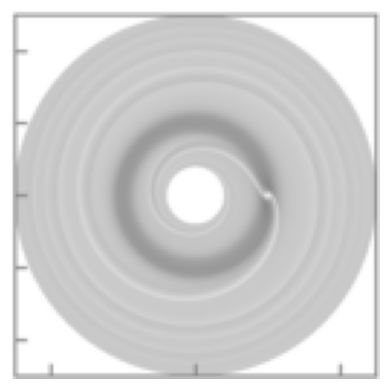

In [10]:
image = next(iter(training_generator))[0]
len(image.shape)
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :] 
    plt.axis('off')
    plt.imshow(reverse_transforms(image))
    
show_tensor_image(image)
# # plt.imshow(image[0][0])

## Building the Diffusion model

In [11]:
import torch.nn.functional as F

def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """ 
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
#     print("the batch size in the get_index function",len(x_shape))
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """ 
    Takes an image and a timestep as input and 
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)

    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    
#     print("sqrt_alphas_cumprod_t",np.shape(sqrt_alphas_cumprod_t))
#     print("x_0",np.shape(x_0))
#     print("sqrt_one_minus_alphas_cumprod_t",np.shape(sqrt_one_minus_alphas_cumprod_t))
#     print("noise",np.shape(noise))
    
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

torch.Size([50, 3, 128, 128])
30


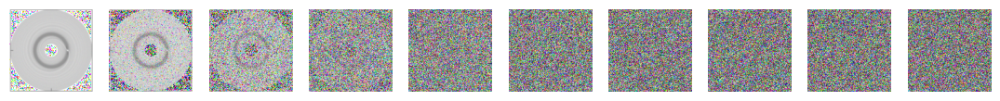

In [12]:
# Simulate forward diffusion
image = next(iter(training_generator))[0]
print(np.shape(image))
plt.figure(figsize=(15,15))
# plt.axis('off')
num_images = 10
stepsize = int(T/num_images)
print(stepsize)
for idx in range(0, T, stepsize):   
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(image, t)
#     print(np.shape(noise))
#     print(np.shape(img))
    show_tensor_image(img)

In [13]:
from torch import nn
import math


class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()
        
    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3 
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )
        
        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])
        
        # Edit: Corrected a bug found by Jakub C (see YouTube comment)
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)           
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
# model

Num params:  62438883


In [14]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

In [15]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    
    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()            

/Users/auddy/opt/miniconda3/envs/torch/lib/python3.9/site-packages/torch/autograd/__init__.py:204: UserWarning: The operator 'aten::sgn.out' is not currently supported on the MPS backend and will fall back to run on the CPU. This may have performance implications. (Triggered internally at /Users/runner/work/_temp/anaconda/conda-bld/pytorch_1687504209468/work/aten/src/ATen/mps/MPSFallback.mm:13.)
  Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch 0 | step 000 Loss: 0.8140637278556824 


/var/folders/1t/7pwwjd7x3mbddh8pt9zf10z40000gr/T/ipykernel_1692/364762590.py:44: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images, int(i/stepsize)+1)


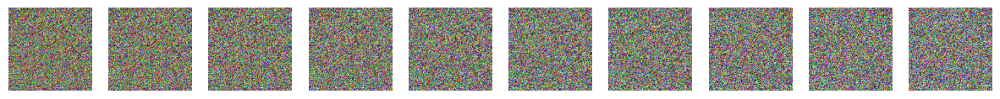

Epoch 5 | step 000 Loss: 0.2075149118900299 


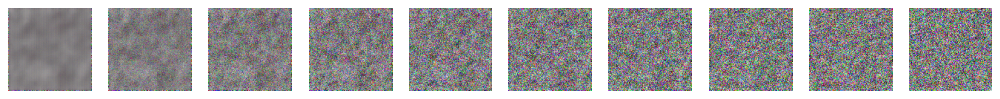

Epoch 10 | step 000 Loss: 0.14512163400650024 


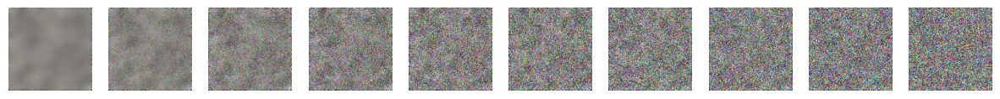

Epoch 15 | step 000 Loss: 0.13346099853515625 


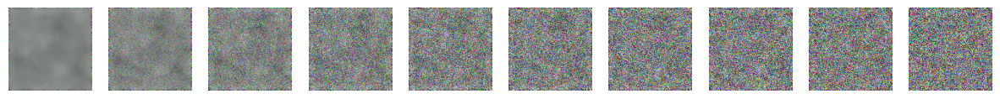

Epoch 20 | step 000 Loss: 0.11971066892147064 


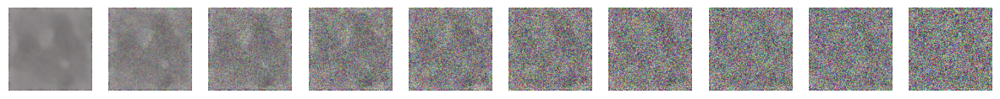

Epoch 25 | step 000 Loss: 0.13192787766456604 


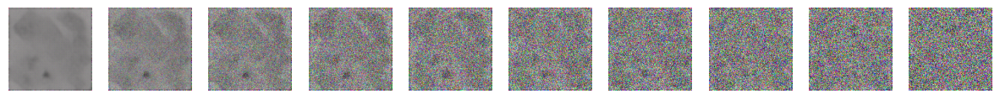

Epoch 30 | step 000 Loss: 0.10131344199180603 


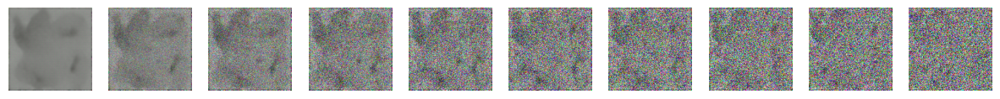

Epoch 35 | step 000 Loss: 0.10232047736644745 


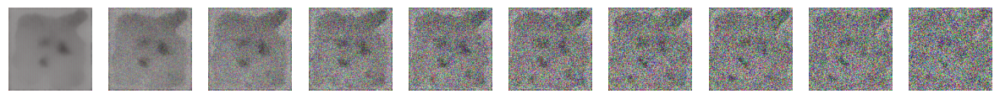

Epoch 40 | step 000 Loss: 0.11222245544195175 


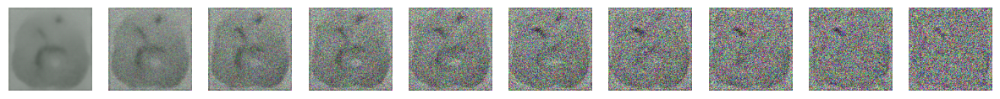

Epoch 45 | step 000 Loss: 0.09054327756166458 


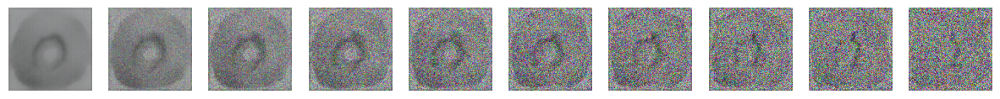

Epoch 50 | step 000 Loss: 0.07304521650075912 


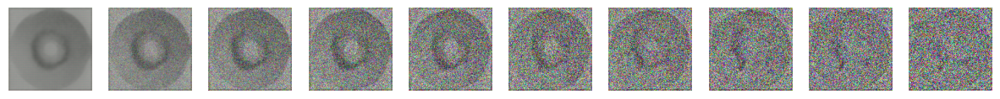

Epoch 55 | step 000 Loss: 0.06674446165561676 


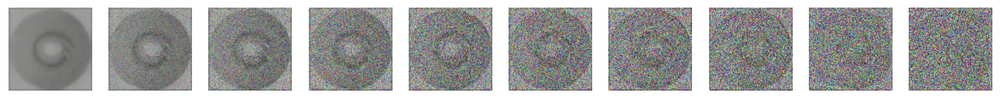

Epoch 60 | step 000 Loss: 0.06972718983888626 


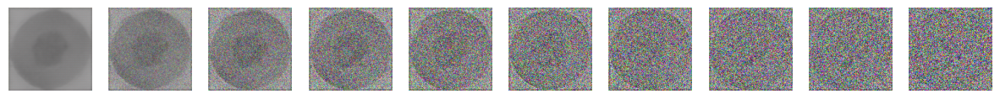

Epoch 65 | step 000 Loss: 0.07029935717582703 


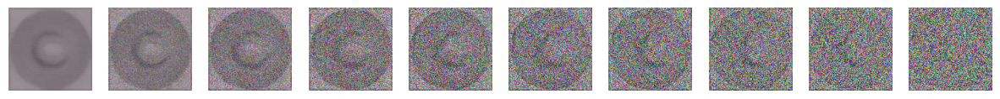

Epoch 70 | step 000 Loss: 0.07948377728462219 


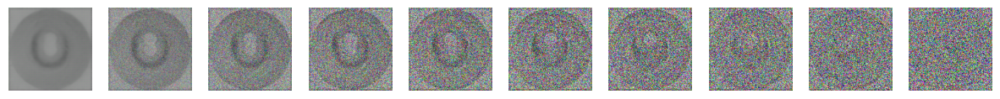

Epoch 75 | step 000 Loss: 0.0648481547832489 


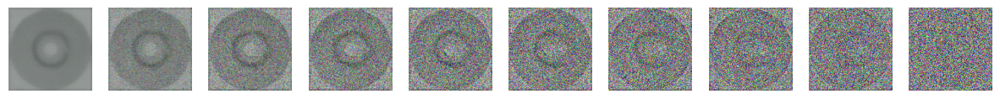

Epoch 80 | step 000 Loss: 0.05588366463780403 


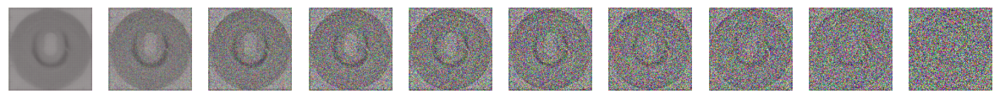

Epoch 85 | step 000 Loss: 0.04785753786563873 


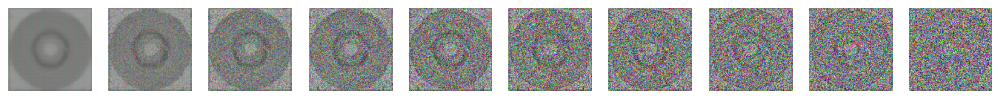

Epoch 90 | step 000 Loss: 0.05664614588022232 


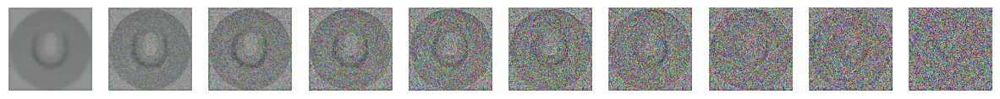

Epoch 95 | step 000 Loss: 0.07184748351573944 


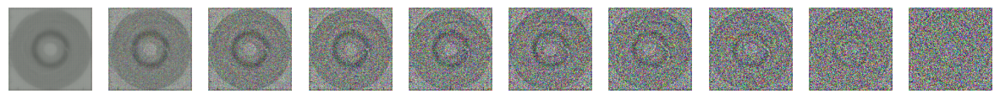

Epoch 100 | step 000 Loss: 0.05372487008571625 


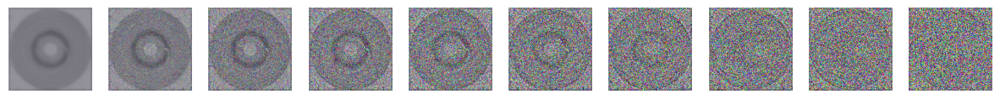

Epoch 105 | step 000 Loss: 0.04923737421631813 


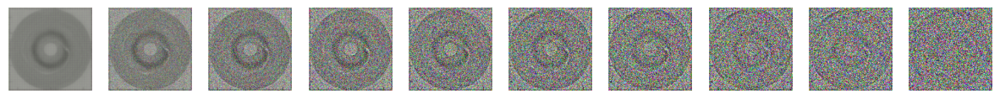

Epoch 110 | step 000 Loss: 0.04786339029669762 


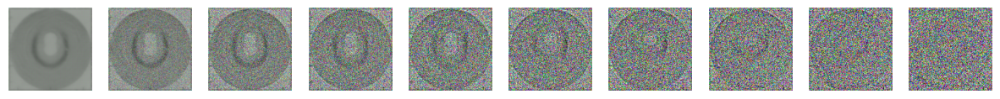

Epoch 115 | step 000 Loss: 0.061097402125597 


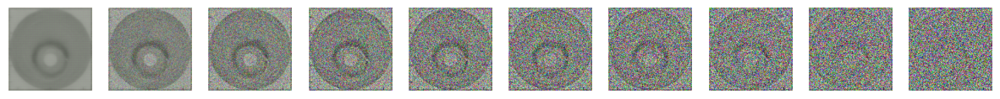

Epoch 120 | step 000 Loss: 0.047835998237133026 


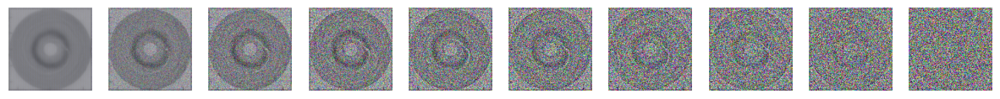

Epoch 125 | step 000 Loss: 0.04968005791306496 


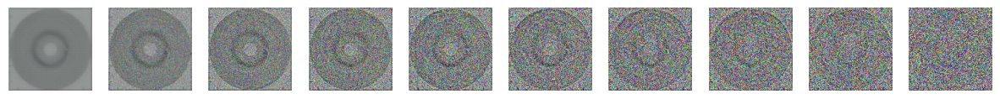

Epoch 130 | step 000 Loss: 0.056023918092250824 


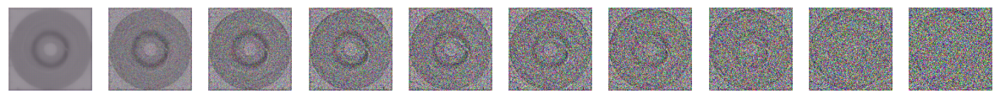

Epoch 135 | step 000 Loss: 0.05243826285004616 


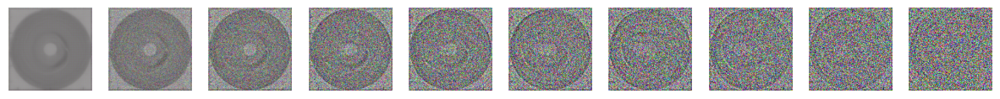

Epoch 140 | step 000 Loss: 0.05052555352449417 


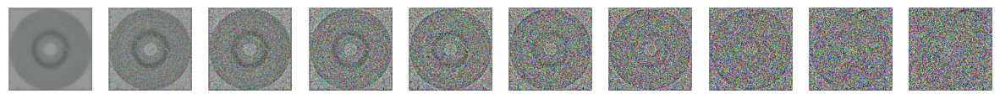

Epoch 145 | step 000 Loss: 0.04791244864463806 


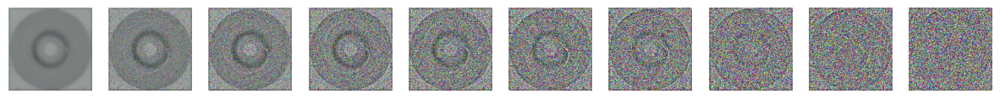

Epoch 150 | step 000 Loss: 0.04827852174639702 


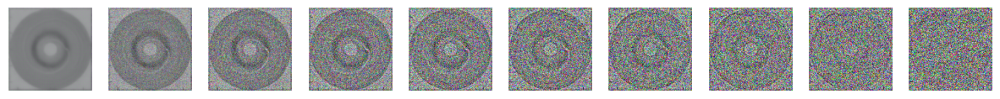

Epoch 155 | step 000 Loss: 0.03819790482521057 


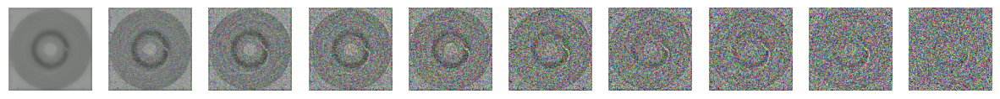

Epoch 160 | step 000 Loss: 0.0476364828646183 


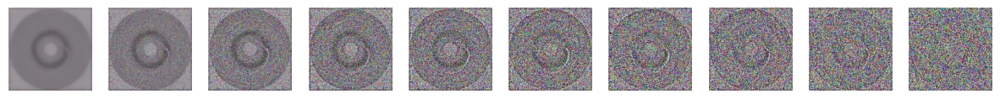

Epoch 165 | step 000 Loss: 0.04166680574417114 


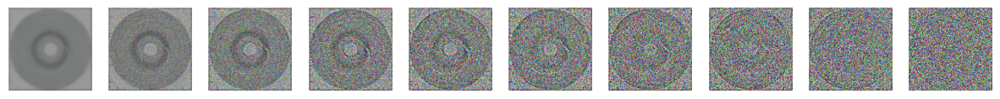

Epoch 170 | step 000 Loss: 0.05843588709831238 


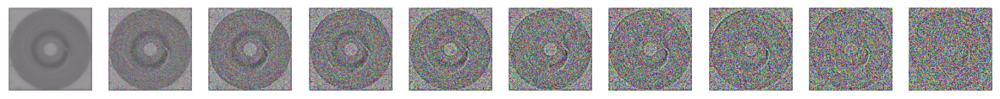

Epoch 175 | step 000 Loss: 0.04416761174798012 


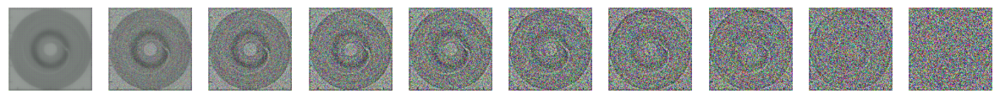

Epoch 180 | step 000 Loss: 0.05499184504151344 


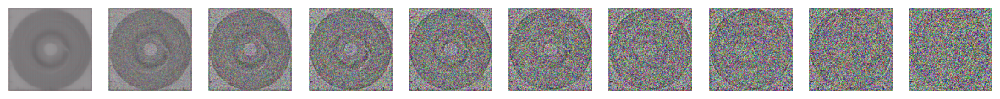

Epoch 185 | step 000 Loss: 0.04249130189418793 


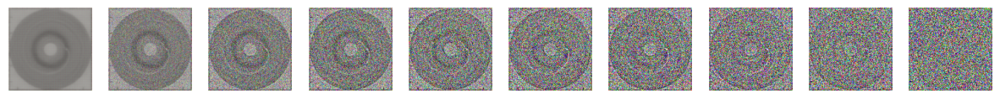

Epoch 190 | step 000 Loss: 0.051410432904958725 


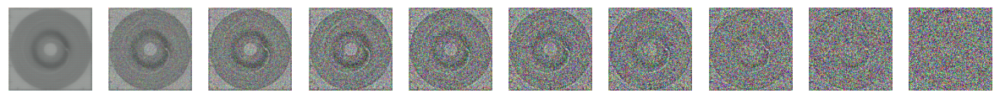

Epoch 195 | step 000 Loss: 0.04708867147564888 


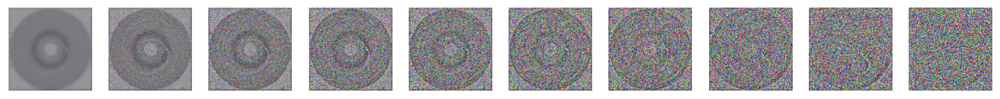

In [16]:
from torch.optim import Adam

# device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 200 # Try more!

for epoch in range(epochs):
    for step,(imgs, _)  in enumerate(training_generator):
#         print(step)
#         print(np.shape(imgs))
        optimizer.zero_grad()

        t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
        loss = get_loss(model, imgs, t)
        loss.backward()
        optimizer.step()

        if epoch % 5 == 0 and step == 0:
            print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
            sample_plot_image()